In [78]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler

from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.metrics import classification_report

from sklearn.metrics import classification_report
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.metrics import precision_score, recall_score, f1_score

from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report


In [34]:
df_calle=pd.read_excel('D:/DataWorks/Calle-2025/db25_modelo.xlsx')

In [35]:
df_calle.drop(columns='Unnamed: 0', inplace=True)
df_calle.drop(columns='LOCALIDAD', inplace=True)
cloumnas_categoricas=df_calle.columns.difference(['EDAD', 'AÑOS VIVIENDO EN LA CALLE']).tolist()

In [36]:
print(df_calle.columns)

Index(['DONDE HA VIVIDO LA MAYOR PARTE DEL TIEMPO', 'TIPO DE DOCUMENTO',
       'SEXO', 'EDAD', 'PUEDE VER', 'PUEDE CAMINAR',
       'PUEDE AGARRAR CON LAS MANOS', 'PUDE VALERSE POR SI MISMO',
       'PUEDER RELACIONARSE CON MAS PERSONAS', 'SABE LEER Y ESCRIBIR',
       'CUAL ES EL NIVEL EDUCATIVO', 'COMO CONSIGUE USTED DINERO',
       'ANOS VIVIENDO EN LA CALLE',
       'EN QUE MUNICIPIO  COMENZO  A VIVIR EN LA CALLE',
       'CUAL FUE LA PRINCIPAL RAZONDE VIVIR EN LA CALLE',
       'RAZON POR LA QUE CONTINUA VIVIENDO EN LA CALLE', 'AYUDA EN DINERO',
       'AYUDA EN ALIMENTACION', 'AYUDA EN ALOJAMIENTO',
       'AYUDA EN APOYO PSICOSOCIAL',
       'AYUDA EN REHABILITACION PARA CONSUMO SPA',
       'AYUDA EN APOYO EMOCIONAL O AFECTIVO', 'AYUDA EN SERVICIOS MEDICOS',
       'AYUDA EN ASEO PERSONAL',
       'PERSONA DE SU FAMILIA DE ORIGEN TIENE CONTACTO',
       'PROBLEMA MENTAL O EMOCIONAL', 'INTENTO DE SUICIDIO',
       'PARA TRATAR EL PROBLEMA DE SALUD', 'Hipertension', 'DIABETES',


In [37]:
df_calle.loc[df_calle['ENFERMEDAD'] =='Ninguna', 'ENFERMEDAD'] = 0 #'N'
df_calle.loc[df_calle['ENFERMEDAD'] =='Hipertension', 'ENFERMEDAD'] =1 # 'H'
df_calle.loc[df_calle['ENFERMEDAD'] =='Diabetes', 'ENFERMEDAD'] = 2 #'D'
df_calle.loc[df_calle['ENFERMEDAD'] =='SIDA', 'ENFERMEDAD'] = 3 #'S'
df_calle.loc[df_calle['ENFERMEDAD'] =='CANCER', 'ENFERMEDAD'] = 4 # 'C'
df_calle.loc[df_calle['ENFERMEDAD'] =='Tuberculosis', 'ENFERMEDAD'] = 5 # 'T'


In [38]:
df_calle['ENFERMEDAD'].value_counts()

ENFERMEDAD
0    9862
1     283
2     150
3      72
4      60
5      51
Name: count, dtype: int64

In [43]:
valor_filtro = 0

# Porcentaje que queremos modificar
porcentaje = 0.011

# Filtrar registros con el valor deseado
subset = df_calle[df_calle['ENFERMEDAD'] == valor_filtro]

# Número de registros a modificar
n = int(len(subset) * porcentaje)

# Seleccionar índices aleatorios del subconjunto
indices_a_modificar = np.random.choice(subset.index, size=n, replace=False)

# Cambiar el valor en la columna deseada
df_calle.loc[indices_a_modificar, 'ENFERMEDAD'] =5



## 1. Preparación del Dataset

In [59]:
arr_names=[
    "WHERE_HAS_LIVED_MOST_OF_THE_TIME",
    "DOCUMENT_TYPE",
    "SEX",
    "AGE",
    "CAN_SEE",
    "CAN_WALK",
    "CAN_GRAB_WITH_HANDS",
    "CAN_MANAGE_ON_THEIR_OWN",
    "CAN_INTERACT_WITH_OTHERS",
    "CAN_READ_AND_WRITE",
    "EDUCATIONAL_LEVEL",
    "HOW_DO_YOU_EARN_MONEY",
    "YEARS_LIVING_ON_THE_STREET",
    "MUNICIPALITY_STARTED_LIVING_ON_THE_STREET",
    "MAIN_REASON_FOR_LIVING_ON_THE_STREET",
    "REASON_FOR_CONTINUING_TO_LIVE_ON_THE_STREET",
    "HELP_WITH_MONEY",
    "HELP_WITH_FOOD",
    "HELP_WITH_HOUSING",
    "HELP_WITH_PSYCHOSOCIAL_SUPPORT",
    "HELP_WITH_SPA_REHABILITATION",
    "HELP_WITH_EMOTIONAL_OR_AFFECTIVE_SUPPORT",
    "HELP_WITH_MEDICAL_SERVICES",
    "HELP_WITH_PERSONAL_HYGIENE",
    "FAMILY_MEMBER_CONTACT",
    "MENTAL_OR_EMOTIONAL_PROBLEM",
    "SUICIDE_ATTEMPT",
    "FOR_TREATING_HEALTH_PROBLEM",
    "HYPERTENSION",
    "DIABETES",
    "CANCER",
    "TUBERCULOSIS",
    "AIDS",
    "SMOKES_CIGARETTES",
    "USES_BASUCO",
    "USES_MARIJUANA",
    "USES_ALCOHOL",
    "USES_INHALANTS",
    "USES_PILLS",
    "USES_COCAINE",
    "USES_HEROIN",
    "MAIN_SUBSTANCE_USED",
    "FREQUENCY_OF_BASUCO_USE",
    "HOW_OBTAINED_FOOD",
    "ACTIVITIES_CONSIDERED_SKILLED_IN",
    "HAD_FORMAL_EMPLOYMENT",
    "DISEASE"
]

df_calle.columns=arr_names

In [62]:
le = LabelEncoder()
y = le.fit_transform(df_calle['DISEASE'])

# 2. Codificar el resto
X = pd.get_dummies(df_calle.drop('DISEASE', axis=1), drop_first=True)




## Transformacion de los datos

## 2. División de datos

In [63]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


## Definicion del Modelo inicial xgboost

In [64]:
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [3, 5],
    'learning_rate': [0.05, 0.1],
    'subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_macro',
    verbose=1,
    n_jobs=-1
)

## Entrenamiento
grid_search.fit(X_train, y_train)
best_model_xg = grid_search.best_estimator_

Fitting 3 folds for each of 16 candidates, totalling 48 fits


C:\Users\Administrador\mi_entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [15:12:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


## Evaluación 

In [47]:
y_pred_xg = best_model_xg.predict(X_test)

# Mostrar métricas
print("Mejores hiperparámetros:", grid_search.best_params_)
print("\nReporte de clasificación:\n")
target_names = [str(cls) for cls in le.classes_]
print(classification_report(y_test, y_pred_xg, target_names=target_names))
print('======================================================================================\n')
precision = precision_score(y_test, y_pred_xg, average='macro')  # o 'weighted'
recall = recall_score(y_test, y_pred_xg, average='macro')        # o 'weighted'
f1 = f1_score(y_test, y_pred_xg, average='macro')                # o 'weighted'

print("Precision (macro):", round(precision, 3))
print("Recall (macro):", round(recall, 3))
print("F1-score (macro):", round(f1, 3))

Mejores hiperparámetros: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}

Reporte de clasificación:

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2801
           1       1.00      0.72      0.84       117
           2       1.00      0.55      0.71        77
           3       1.00      0.41      0.58        54
           4       1.00      0.39      0.56        49
           5       0.94      0.33      0.48        46

    accuracy                           0.95      3144
   macro avg       0.98      0.56      0.69      3144
weighted avg       0.95      0.95      0.94      3144


Precision (macro): 0.981
Recall (macro): 0.564
F1-score (macro): 0.689


In [23]:
##**************************************************  Confianza y aceptabilidad (TAS)



# Simulamos puntuaciones Likert (1 a 5) de 10478 personas
puntuaciones = np.random.randint(1, 6, size=10478)

# Normalizamos de 0 a 1 (opcional)
puntuaciones_norm = (puntuaciones - 1) / 4

# Calculamos la TAS
TAS = np.mean(puntuaciones_norm)

print(f"Puntuaciones: {puntuaciones}")
print(f"TAS (normalizada): {TAS:.2f}")


### **********************************************  Tiempo de respuesta social (SRT)
tiempos_alerta = np.zeros(10478)
tiempos_intervencion = np.random.uniform(2, 48, size=10478)

# Tiempo de respuesta individual
tiempos_respuesta = tiempos_intervencion - tiempos_alerta

# Calculamos la SRT
SRT = np.mean(tiempos_respuesta)

print(f"Tiempos de respuesta (horas): {tiempos_respuesta}")
print(f"SRT promedio (horas): {SRT:.2f}")



#### ********************************************* Impacto potencial en la salud (PHIS)

# Valores simulados
reduccion_eventos = 0.30  # 30% reducción en eventos críticos
aumento_vida = 0.10       # 10% aumento estimado en expectativa/vida sana
aumento_adherencia = 0.25 # 25% aumento en adherencia

# Pesos definidos (puedes ajustarlos según prioridad)
w1, w2, w3 = 0.5, 0.2, 0.3

# Calculamos PHIS
PHIS = w1 * reduccion_eventos + w2 * aumento_vida + w3 * aumento_adherencia

print(f"PHIS: {PHIS:.2f}")

Puntuaciones: [2 1 4 ... 5 3 1]
TAS (normalizada): 0.49
Tiempos de respuesta (horas): [24.40701063 13.68092698  9.76598431 ... 38.75794027 21.19460447
 10.87518203]
SRT promedio (horas): 24.86
PHIS: 0.24


## Inicio del entrenamiento del modelo Random Forest

In [98]:
rf_model = RandomForestClassifier(random_state=42)

# Definir la grilla de hiperparámetros
param_grid = {
    'n_estimators': [50, 100],      # número de árboles
    'max_depth': [3, 5, None],      # profundidad máxima
    'max_features': ['sqrt', 'log2'],  # número de features en cada split
    'bootstrap': [True, False]      # usar o no muestreo con reemplazo
}

# Búsqueda en grilla
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_macro',
    verbose=1,
    n_jobs=-1
)

# Entrenamiento
grid_search.fit(X_train, y_train)
best_model_rf = grid_search.best_estimator_


Fitting 3 folds for each of 24 candidates, totalling 72 fits


## Evaluar Random Forest

In [99]:
y_pred_r= best_model_rf.predict(X_test)
print("Mejores hiperparámetros:", grid_search.best_params_)
print("\nReporte de clasificación:\n")
print(classification_report(y_test, y_pred_r, target_names=target_names))
print("==============================================================================================\n")

precision = precision_score(y_test, y_pred_xg, average='macro')  # o 'weighted'
recall = recall_score(y_test, y_pred_r, average='macro')        # o 'weighted'
f1 = f1_score(y_test, y_pred_r, average='macro')                # o 'weighted'

print("Precision (macro):", round(precision, 3))
print("Recall (macro):", round(recall, 3))
print("F1-score (macro):", round(f1, 3))


Mejores hiperparámetros: {'bootstrap': False, 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 100}

Reporte de clasificación:

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      2801
           1       1.00      0.72      0.84       116
           2       0.98      0.57      0.72        76
           3       0.95      0.36      0.52        53
           4       1.00      0.36      0.53        50
           5       1.00      0.33      0.50        48

    accuracy                           0.95      3144
   macro avg       0.98      0.56      0.68      3144
weighted avg       0.95      0.95      0.94      3144


Precision (macro): 0.991
Recall (macro): 0.557
F1-score (macro): 0.68


## Clasificador basado en Redes neuronales 

In [75]:
mlp_model = MLPClassifier(max_iter=500, random_state=42)

# Grilla de hiperparámetros
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],  # capas ocultas
    'activation': ['relu', 'tanh'],                  # función de activación
    'solver': ['adam', 'sgd'],                       # optimizador
    'alpha': [0.0001, 0.001],                        # regularización L2
    'learning_rate': ['constant', 'adaptive']        # tasa de aprendizaje
}

# Búsqueda en grilla
grid_search = GridSearchCV(
    estimator=mlp_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_macro',
    verbose=1,
    n_jobs=-1
)

# Entrenamiento
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

Fitting 3 folds for each of 48 candidates, totalling 144 fits


## Resultados redes neuronales

In [78]:
y_pred_rn= best_model.predict(X_test)


print("Mejores hiperparámetros:", grid_search.best_params_)
print("\nReporte de clasificación:\n")
print(classification_report(y_test, y_pred_rn, target_names=target_names))
print('==================================================================================================\n')
precision = precision_score(y_test, y_pred_rn, average='macro')  # o 'weighted'
recall = recall_score(y_test, y_pred_rn, average='macro')        # o 'weighted'
f1 = f1_score(y_test, y_pred_rn, average='macro')                # o 'weighted'

print("Precision (macro):", round(precision, 3))
print("Recall (macro):", round(recall, 3))
print("F1-score (macro):", round(f1, 3))


Mejores hiperparámetros: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}

Reporte de clasificación:

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      2676
           1       0.99      0.58      0.73       139
           2       0.72      0.50      0.59       101
           3       0.58      0.19      0.29        78
           4       0.42      0.14      0.22        76
           5       0.09      0.01      0.02        74

    accuracy                           0.89      3144
   macro avg       0.62      0.40      0.46      3144
weighted avg       0.86      0.89      0.86      3144


Precision (macro): 0.617
Recall (macro): 0.401
F1-score (macro): 0.464


### Clasificador Bagging

In [17]:

#  Pipeline del modelo Bagging + RF

bag_model = BaggingClassifier(
   estimator=DecisionTreeClassifier(),
    random_state=42
)

# Grilla de hiperparámetros
param_grid = {
    'n_estimators': [10, 50, 100],         # número de estimadores
    'max_samples': [0.5, 0.8, 1.0],        # porcentaje de muestras por modelo
    'max_features': [0.5, 1.0],            # porcentaje de features por modelo
    'bootstrap': [True, False]             # muestreo con o sin reemplazo
}

# Búsqueda en grilla
grid_search = GridSearchCV(
    estimator=bag_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_macro',
    verbose=1,
    n_jobs=-1
)

# Entrenamiento
grid_search.fit(X_train, y_train)
best_model_bg = grid_search.best_estimator_

Fitting 3 folds for each of 36 candidates, totalling 108 fits


## Evaluacion  bagging

In [18]:
#  Evaluación
print("Mejores hiperparámetros:", grid_search.best_params_)
y_pred_bg = best_model_bg.predict(X_test)

print(classification_report(y_test, y_pred_bg, target_names=target_names))
print('================================================================================')

precision = precision_score(y_test, y_pred_bg, average='macro')  # o 'weighted'
recall = recall_score(y_test, y_pred_bg, average='macro')        # o 'weighted'
f1 = f1_score(y_test, y_pred_bg, average='macro')                # o 'weighted'

print("Precision (macro):", round(precision, 3))
print("Recall (macro):", round(recall, 3))
print("F1-score (macro):", round(f1, 3))

Mejores hiperparámetros: {'bootstrap': False, 'max_features': 0.5, 'max_samples': 0.8, 'n_estimators': 100}
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2801
           1       1.00      0.74      0.85       117
           2       0.96      0.62      0.76        77
           3       1.00      0.22      0.36        54
           4       1.00      0.35      0.52        49
           5       1.00      0.37      0.54        46

    accuracy                           0.95      3144
   macro avg       0.98      0.55      0.67      3144
weighted avg       0.95      0.95      0.94      3144

Precision (macro): 0.984
Recall (macro): 0.549
F1-score (macro): 0.666


## Boosting clasificador 

In [19]:
boost_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(),
    random_state=42
)

# Grilla de hiperparámetros
param_grid = {
    'n_estimators': [50, 100, 200],          # número de clasificadores
    'learning_rate': [0.5, 1.0, 1.5],        # tasa de aprendizaje
    'estimator__max_depth': [1, 2, 3]        # profundidad del árbol base
}

# GridSearchCV
grid_search = GridSearchCV(
    estimator=boost_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_macro',
    verbose=1,
    n_jobs=-1
)

# Entrenamiento
grid_search.fit(X_train, y_train)
best_model_bo = grid_search.best_estimator_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


In [20]:
y_pred_bo = best_model_bo.predict(X_test)
print("Mejores hiperparámetros:", grid_search.best_params_)

print(classification_report(y_test, y_pred_bo, target_names=target_names))

print('===========================================================================================')

precision = precision_score(y_test, y_pred_bo, average='macro')  # o 'weighted'
recall = recall_score(y_test, y_pred_bo, average='macro')        # o 'weighted'
f1 = f1_score(y_test, y_pred_bo, average='macro')                # o 'weighted'

print("Precision (macro):", round(precision, 3))
print("Recall (macro):", round(recall, 3))
print("F1-score (macro):", round(f1, 3))

Mejores hiperparámetros: {'estimator__max_depth': 3, 'learning_rate': 0.5, 'n_estimators': 50}
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2801
           1       1.00      0.74      0.85       117
           2       1.00      0.62      0.77        77
           3       1.00      0.24      0.39        54
           4       0.95      0.37      0.53        49
           5       1.00      0.35      0.52        46

    accuracy                           0.95      3144
   macro avg       0.98      0.55      0.67      3144
weighted avg       0.95      0.95      0.94      3144

Precision (macro): 0.982
Recall (macro): 0.552
F1-score (macro): 0.67


In [105]:
df_calle.to_excel('D:/DataWorks/Calle-2025/db25_modelo_G.xlsx')

## Shap Values

In [65]:
import shap


explainer = shap.TreeExplainer(best_model_xg)
shap_values = explainer.shap_values(X)

sample_size = 1000  # O menos si sigue fallando
sample_idx = np.random.choice(X.shape[0], sample_size, replace=False)
plt.figure(figsize=(20, 20))
shap.summary_plot(shap_values[sample_idx], X.iloc[sample_idx], plot_type="bar",show=False)
plt.tight_layout()


plt.savefig("d:/mi_force_plot.png", dpi=300, bbox_inches='tight')
plt.close()

C:\Users\Administrador\AppData\Local\Temp\ipykernel_24192\1045657334.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[sample_idx], X.iloc[sample_idx], plot_type="bar",show=False)


In [66]:
shap.initjs()
sample_size = 1000  # O menos si sigue fallando
sample_idx = np.random.choice(df_calle.shape[0], sample_size, replace=False)

#shap.summary_plot(shap_values[sample_idx], X.iloc[sample_idx], plot_type="bar")
shap.plots.force(explainer.expected_value[0], shap_values[sample_idx, :, 0])

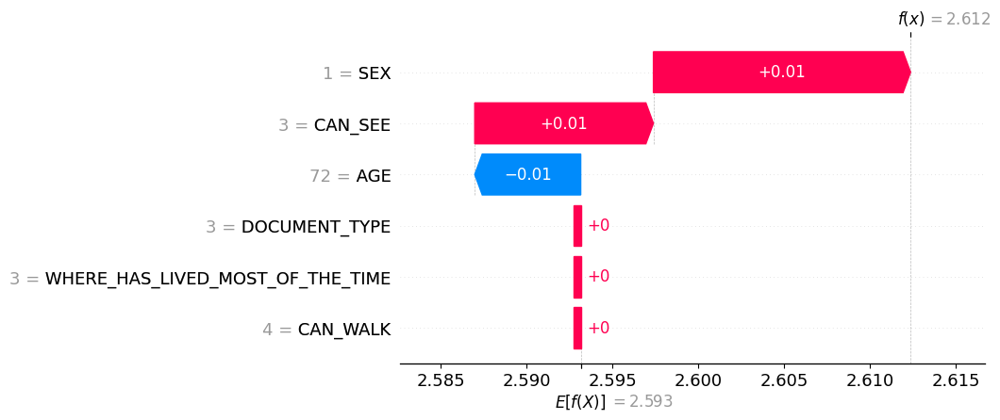

In [77]:
shap.plots.waterfall(shap.Explanation(values=shap_values[20][0, :],
                                      base_values=explainer.expected_value[0],
                                      data=X.iloc[20, :],
                                      feature_names=X.columns))




In [32]:
shap.plots.waterfall(shap.Explanation(values=shap_values[0][index_to_use, :],
                                      base_values=explainer.expected_value[1],
                                      data=X.iloc[index_to_use, :],
                                      feature_names=X.columns))

NameError: name 'index_to_use' is not defined

In [81]:
shap_values_class0 = shap_values[0]
shap.plots.force(explainer.expected_value[0], shap_values_class0[index_to_use, :])

In [31]:
np.random.seed(0)
X = pd.DataFrame(np.random.rand(300, 10), columns=[f'feature_{i}' for i in range(10)])
y = np.random.randint(0, 3, 300)

# Nuevo modelo
model_clean = xgb.XGBClassifier( eval_metric='mlogloss', objective='multi:softprob', num_class=3)
model_clean.fit(X, y)

# Explainer en feature space
explainer = shap.TreeExplainer(model_clean, X, model_output="margin")

# SHAP values
shap_values = explainer.shap_values(X)

class_index = 0
row_index = 2

# Force plot
shap.force_plot(
    explainer.expected_value[class_index],
    shap_values[class_index][row_index, :],
    X.iloc[row_index, :],
    matplotlib=True  # para que salga directo en notebook, o quítalo si usas en HTML interactivo
)

Exception: Model does not have a known objective or output type! When model_output is not "raw" then we need to know the model's objective or link function.